In [ ]:
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.5/565.5 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.1/203.1 kB 14.1 MB/s eta 0:00:00


In [ ]:
import os
import shutil
import random
!pip install tqdm --upgrade
from tqdm.notebook import tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


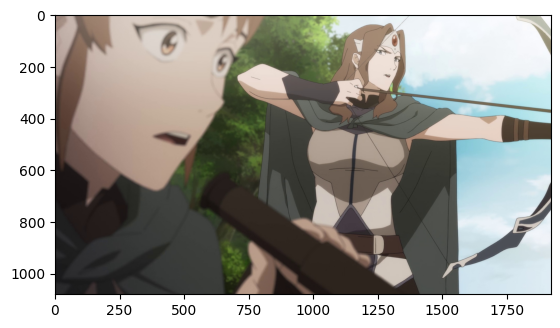

In [ ]:
import cv2
import matplotlib.pyplot as plt
BASE_DIR = "/content/drive/MyDrive/dataforsegmentation"
image = cv2.imread(BASE_DIR+"/images/"+"004b1856-1frame0-21-26.50.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

<h1>НЕ РЕРАНИТЬ!!!!!</h1>

In [ ]:


os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir")
train_path_img = "/content/drive/MyDrive/dataforsegmentation/yolodir/images/train"
train_path_label = "/content/drive/MyDrive/dataforsegmentation/yolodir/labels/train"
test_path_img = "/content/drive/MyDrive/dataforsegmentation/yolodir/images/test"
test_path_label = "/content/drive/MyDrive/dataforsegmentation/yolodir/labels/test"
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/images")
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/labels")
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/images/train")
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/images/test")
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/labels/train")
os.mkdir("/content/drive/MyDrive/dataforsegmentation/yolodir/labels/test")

In [ ]:
import numpy as np
test_prob = 0.2
counter = 0
for _,_,filenames in os.walk(BASE_DIR+"/images"):
  for url in filenames:
    counter+=1
    if(random.random()>test_prob):
      shutil.copy2(BASE_DIR+"/images/"+url, train_path_img+"/"+url)
      shutil.copy2(BASE_DIR+"/labels/"+url[:-3]+"txt", train_path_label+"/"+url[:-3]+"txt")
    else:
      shutil.copy2(BASE_DIR+"/images/"+url, test_path_img+"/"+url)
      shutil.copy2(BASE_DIR+"/labels/"+url[:-3]+"txt", test_path_label+"/"+url[:-3]+"txt")
    if counter%50==49:
      print(counter)

<H1>Использование YOLOv8</H1>

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.93 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.0/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.yaml').load("/content/runs/detect/train8/weights/best.pt")
results = model.train(data='dataset.yaml', epochs=10)



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.Conv                  [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.Conv                  [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.C2f                   [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.Conv                  [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.C2f                   [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.Conv                  [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.C2f                   [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.Conv                  [128

In [ ]:
results = model.train(data='dataset.yaml', epochs=30)

Ultralytics YOLOv8.0.93 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=dataset.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=None, worksp

In [ ]:
result[0].boxes.data

tensor([[1.2482e+03, 2.3220e+02, 1.7851e+03, 1.0800e+03, 2.6180e-01, 1.0000e+00]], device='cuda:0')

In [ ]:
classes = ["Dragon Knight", "Mirana"]
def drawBoxes(res):
  img = cv2.cvtColor(res.orig_img, cv2.COLOR_BGR2RGB)
  xywh = []
  if(res.boxes.data.size>0):
    for i in range(4):
      xywh.append(round(res.boxes.data[0][i].item()))
    if(xywh[0]+xywh[2]>=1920):
        xywh[2]=1920-xywh[0]
    if(xywh[1]+xywh[3]>=1080):
        xywh[3]=1080-xywh[1]
    for x in range(xywh[0], xywh[0]+xywh[2]):
      for y in range(xywh[1], xywh[1]+xywh[3]):
        img[y][x][1] = 255
  plt.imshow(img)
  print(classes[round(res.boxes.data[0][5].item())], res.boxes.data[0][4].item())

<h1>Обработка видео</h1>

In [ ]:
#from ultralytics import YOLO
#model = YOLO('yolov8n.yaml').load("/content/drive/MyDrive/dataforsegmentation/best(1).pt")
results = model("/content/drive/MyDrive/dataforsegmentation/DOTA.Dragons.Blood.S01E05.1080p.WEB.h264-PALEALE_1616695117_1080p.mp4", stream=True, show=True, save=True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



In [ ]:
for result in results:
  result.plot()

In [ ]:
shutil.copy2("/content/runs/detect/predict/DOTA.Dragons.Blood.S01E05.1080p.WEB.h264-PALEALE_1616695117_1080p.mp4","/content/drive/MyDrive/dataforsegmentation/DOTA.Dragons.Blood1.S01E05.1080p.WEB.h264-PALEALE_1616695117_1080p.mp4")

'/content/drive/MyDrive/dataforsegmentation/DOTA.Dragons.Blood1.S01E05.1080p.WEB.h264-PALEALE_1616695117_1080p.mp4'

<h1>Результаты обучения</h1>

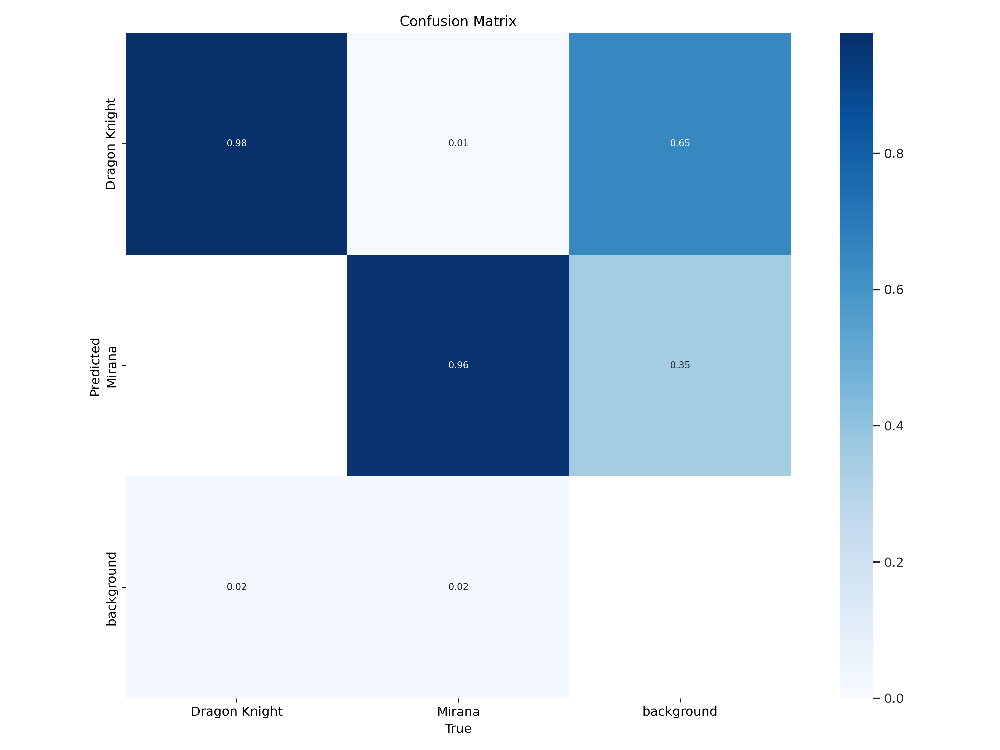

In [ ]:
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/runs/detect/train7/confusion_matrix.png")
cv2_imshow(image)

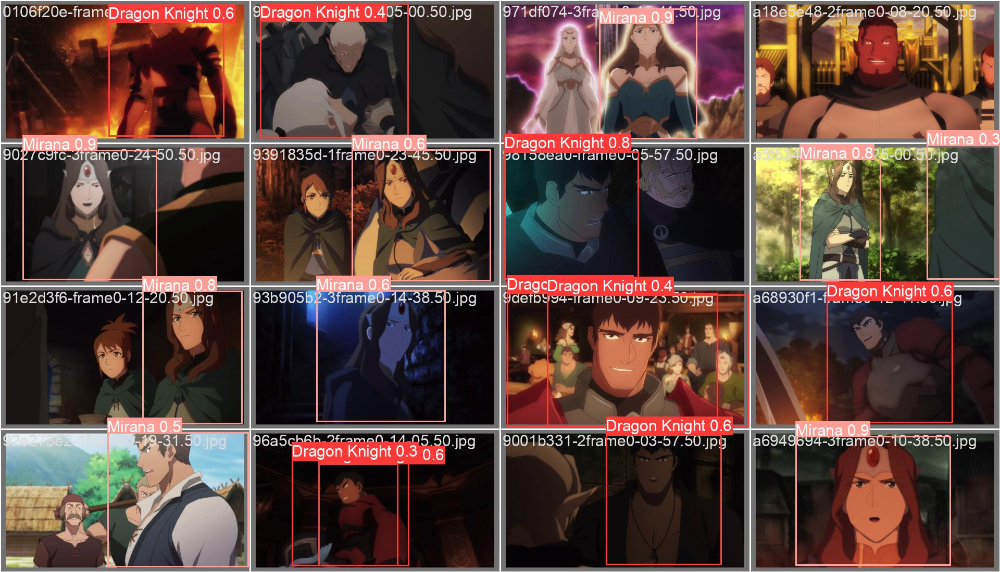

In [ ]:
image = cv2.imread("/content/runs/detect/train/val_batch0_pred.jpg")
cv2_imshow(image)

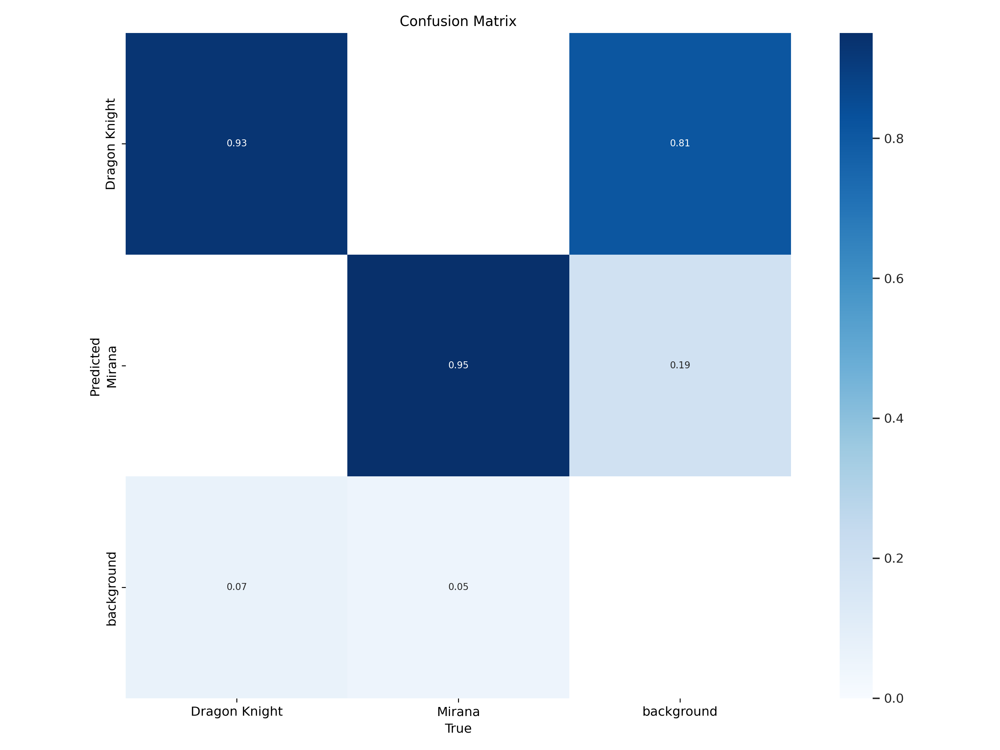

In [ ]:
image = cv2.imread("/content/runs/detect/train4/confusion_matrix.png")
cv2_imshow(image)

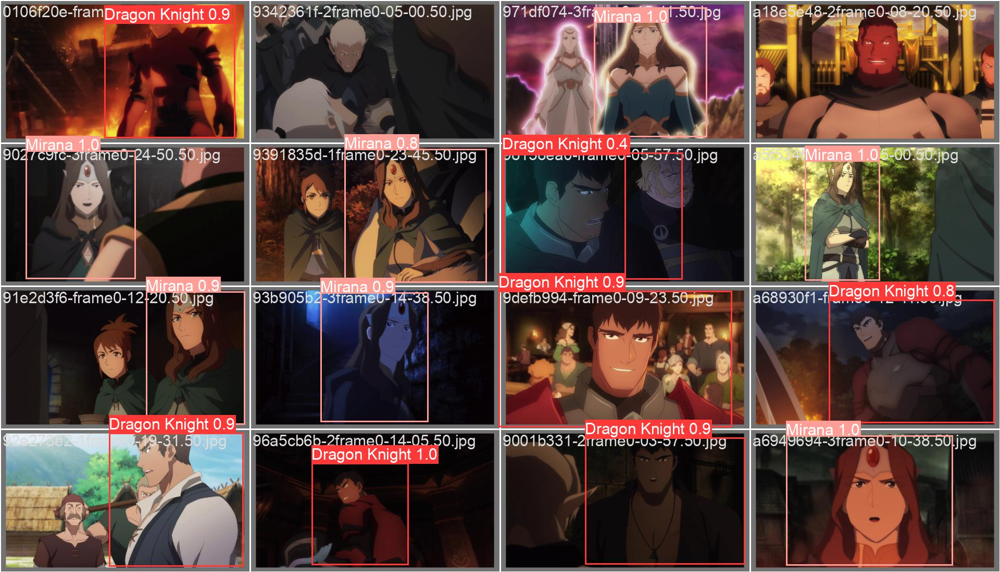

In [ ]:
image = cv2.imread("/content/runs/detect/train7/val_batch0_pred.jpg")
cv2_imshow(image)

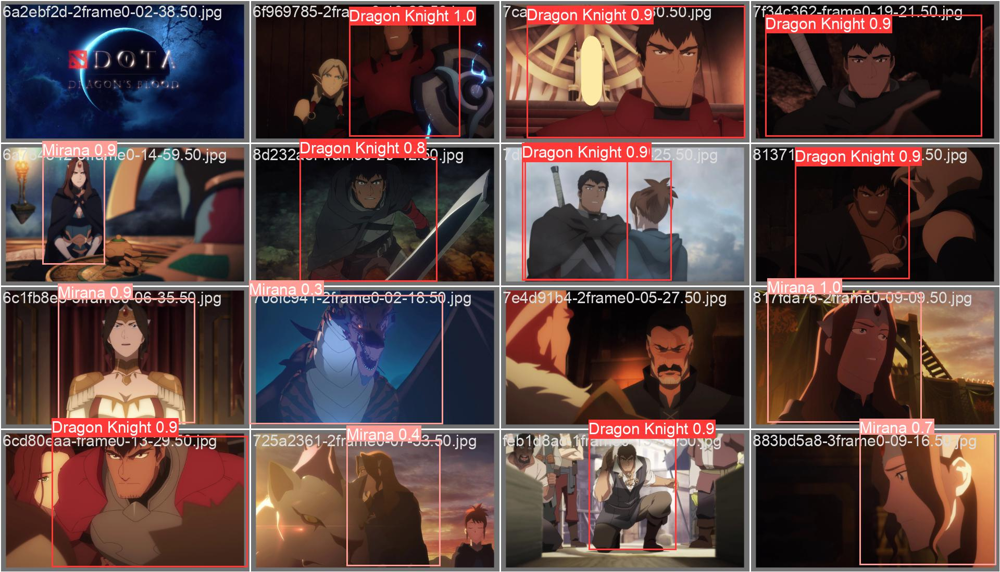

In [ ]:
image = cv2.imread("/content/runs/detect/train7/val_batch1_pred.jpg")
cv2_imshow(image)

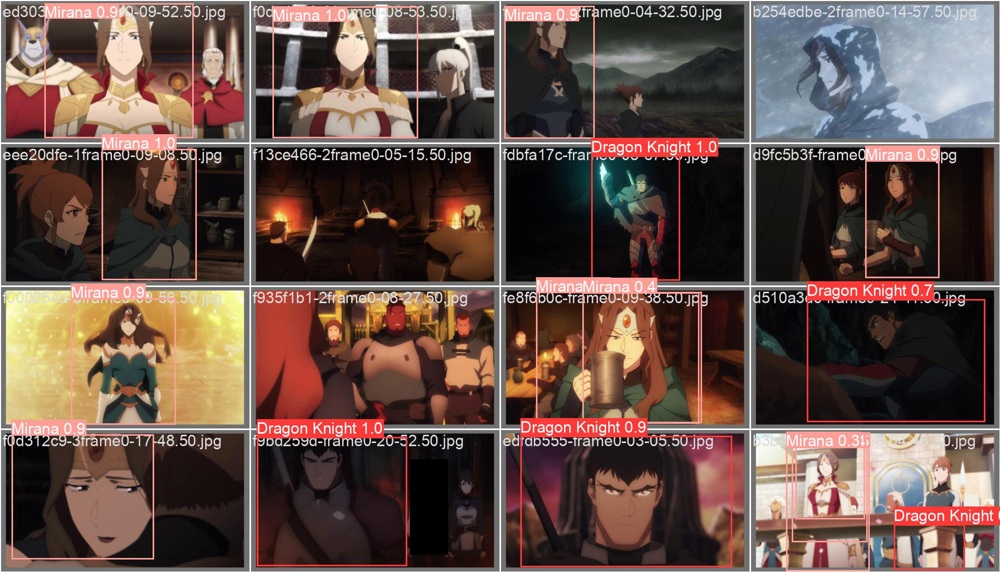

In [ ]:
image = cv2.imread("/content/runs/detect/train7/val_batch2_pred.jpg")
cv2_imshow(image)